In [1]:
%load_ext autoreload
%autoreload 2
import os, sys
import numpy as np
import pandas as pd
import scanpy as sc
import PINN
import torch

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import palantir

In [3]:
os.chdir("/ssd/users/Wergillius/Project/PINN_dynamics")

In [4]:
plt.rcParams['figure.dpi']=60
plt.rcParams['figure.figsize']=(2.5,2.5)

In [23]:
import warnings
warnings.filterwarnings("ignore")

# load model and get the growth and velocity

In [5]:
from PINN import reader

In [6]:
meahr_monocle = sc.read_h5ad("data/meahr_monocle.h5ad")

In [7]:
import phate

In [59]:
for g in ['Flt3', 'Cd44', 'Cd25', 'Il2ra', 'Rorc', 'Id3', 'Cd4', 'Cd8', "Leu3" , 'T4', 'Ptcra']:
    if g in meahr_raw.var_names:
        print(g)



Cd44
Il2ra
Rorc
Id3


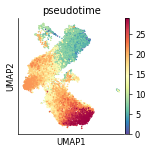

In [9]:
# sc.pp.neighbors(meahr_monocle, n_neighbors=5, n_pcs=50)
# sc.tl.umap(meahr_monocle)

# X_umap = meahr_monocle.obsm['X_umap']
# X_umap[:,1] *= -1
# meahr_monocle.obsm['X_umap'] = X_umap
# meahr_monocle.write_h5ad("data/meahr_monocle.h5ad")

# sc.tl.leiden(meahr_monocle)

sc.pl.umap(meahr_monocle, color='pseudotime')

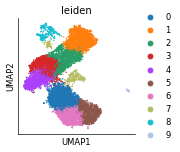

In [130]:
sc.tl.leiden(meahr_monocle, resolution=0.6, random_state=0)
meahr_monocle.obs['leiden'] = meahr_monocle.obs.leiden.replace('10','6')
sc.pl.umap(meahr_monocle, color='leiden')

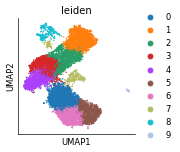

In [199]:
sc.pl.umap(meahr_monocle, color='leiden')

In [126]:
celltype_map = {'0':'Phase3 (DN3b/DN4)', '1': 'stem', '2':'DN2a', 
 '3':'Phase2-1 (DN2b/DN3a)', '4': 'Phase2-2', '5':'DP-2', '6':'DP-1', '7':'NCL', '8':'NCL', '9':'NCL'}

meahr_monocle.obs['celltype'] = meahr_monocle.obs.leiden.map(celltype_map)

In [ ]:
cellcycle = pd.read_table("data/mouse_geneset/regev_lab_cell_cycle_gene_mouse.txt", names=['gene'])
genes = cellcycle['gene'].values
s_gene = genes[:44]
g2m_gene = genes[44:]
sc.tl.score_genes_cell_cycle(meahr_monocle, s_genes = s_gene, g2m_genes = g2m_gene)

In [192]:
meahr_monocle.write_h5ad("data/meahr_monocle.h5ad")

In [193]:
meahr_monocle.uns['celltype_colors']

['#1f77b4',
 '#ff7f0e',
 '#2ca02c',
 '#d62728',
 '#9467bd',
 '#8c564b',
 '#e377c2',
 '#7f7f7f']

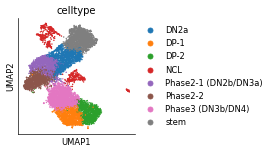

In [128]:
sc.pl.umap(meahr_monocle, color='celltype')

In [171]:
from PINN import pl
def aggregate_params_by_pseudotime(params, param_names='g v2', timepoints=None, adata=meahr_monocle, pseudotime_key='pseudotime_scaled',nbins=100, return_y=True):
    
    # PINN.pl.params_in_umap(adata, params, param=param_names, cell_of_t=False,subplot_kws={'frameon':False, 'dpi':60});
    # pl.params_in_umap(adata, params, param=param_names, timepoints=timepoints, copy=False, cell_of_t=False);
    
    pdt_bins = np.linspace(0,1,nbins+1)
    pdt_label = (pdt_bins[1:] + pdt_bins[:-1])/2
    adata.obs['pseudotime_bin'] = pd.cut(adata.obs[pseudotime_key], bins=nbins,
                                                labels = pdt_label)


    timepoints = adata.uns['pop']['t'] if timepoints is None else timepoints 
    fig, axs = plt.subplots(1, len(timepoints), figsize=(4*len(timepoints)+1,3), gridspec_kw={"wspace":0.4, 'hspace':0.3})
    axs = axs.flatten() if len(timepoints)>1 else [axs]
    
    for i,t in enumerate(timepoints):
        y_col = 'Day%s_'%t + param_names
        data = adata.obs[['pseudotime_bin']]
        data[y_col] = params[i]
        gdata = data.groupby("pseudotime_bin").agg({y_col:"mean"}).reset_index()

        x = np.sort(gdata.pseudotime_bin.unique())
        y = gdata[y_col].values

        model2 = np.poly1d(np.polyfit(x, gdata[y_col], 7))

        x_smooth = (x[1:] + x[:-1] )/2
        y_smooth = (y[1:] + y[:-1] )/2

        axs[i].scatter(x_smooth, y_smooth, alpha=0.8)
        axs[i].plot(x, model2(x), color='red', alpha=0.4)
    if return_y:
        return y
    else:
        return fig, axs


from PINN import pl
def params_agg_boxplot(params, param_names='g v2', timepoints=None, adata=meahr_monocle, agg_key='pseudotime_scaled'):
    
    # PINN.pl.params_in_umap(adata, params, param=param_names, cell_of_t=False,subplot_kws={'frameon':False, 'dpi':60});
    # pl.params_in_umap(adata, params, param=param_names, timepoints=timepoints, copy=False, cell_of_t=False);
    
    if 'pseudotime' in agg_key:
        agg_key = 'pseudotime_bin'
        pdt_bins = np.linspace(0,1,101)
        pdt_label = (pdt_bins[1:] + pdt_bins[:-1])/2
        adata.obs['pseudotime_bin'] = pd.cut(adata.obs[agg_key], bins=100,
                                                    labels = pdt_label)


    timepoints = adata.uns['pop']['t'] if timepoints is None else timepoints 
    fig, axs = plt.subplots(1, len(timepoints), figsize=(4*len(timepoints)+1,3), gridspec_kw={"wspace":0.4, 'hspace':0.3})
    axs = axs.flatten() if len(timepoints)>1 else [axs]
    
    for i,t in enumerate(timepoints):
        y_col = 'Day%s_'%t + param_names
        data = adata.obs[[agg_key]]
        data[y_col] = params[i]
        
        sns.boxplot(data=data, x=agg_key, y=y_col, ax=axs[i])
        
    return fig, axs

# test mellon

In [56]:
import mellon

In [57]:
X = meahr_monocle.obsm['DM_EigenVectors'].copy()
X_times = meahr_monocle.obs['time'].values

In [ ]:
# this code is here to prevent accidental usage of default values on new data
ls_time_estimate = 1.5 * np.mean(np.diff(np.sort(np.unique(X_times))))
print(ls_time_estimate)

# Initialize the time-sensitive density estimator with an intrinsic dimensionality of 2
t_est = mellon.TimeSensitiveDensityEstimator(d=None, ls_time=ls_time_estimate)

t_est.fit(X, X_times)

# Save the predictor for later density evaluations
density_predictor = t_est.predict

log_u_mellon = []
for time in meahr_monocle.uns['pop']['t']:
    log_u_mellon.append(density_predictor(X, time))
log_u_mellon = np.stack(log_u_mellon)
print(log_u_mellon.shape)



with plt.rc_context({'figure.dpi':30}):
    aggregate_params_by_pseudotime(log_u_mellon, 'mellon_log_u')

In [206]:
meahr_monocle = meahr_monocle[meahr_monocle.obs.leiden!='9']

bw = None
n_timepoint = 8
n_dimension = 7

train_DS = reader.TwoTimpepoint_AnnDS(
                    AnnData=meahr_monocle, 
                    timepoint_idx=None, 
                    n_dimension = n_dimension,
                    cellstate_key='DM_EigenVectors_multiscaled',  #'DM_EigenVector'
                    log_transform=False,
                    norm_time='min_minus',
                    deltax_key='Delta_DM',
                    kde_kws = {"bw_method":bw},
                    batchsize=200)

u_b = train_DS.u_b.numpy()

Computing density :
`density_funs` not specified, use gaussian kde


prediction of shape (8, 10072)


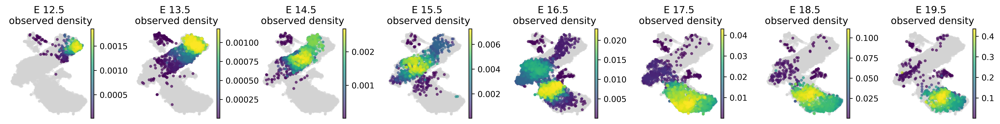

In [207]:
%matplotlib inline

fig, axs = PINN.pl.params_in_umap(train_DS.adata, u_b, param=f'u obs bw{bw}', subplot_kws={'frameon':False, 'dpi':600});
for i,t in enumerate(train_DS.popD['t']):
    axs[i].set_title(f'E {t}\n observed density')

In [209]:
fig.savefig("results/meahr/observed_density.pdf")

prediction of shape (8, 10072)


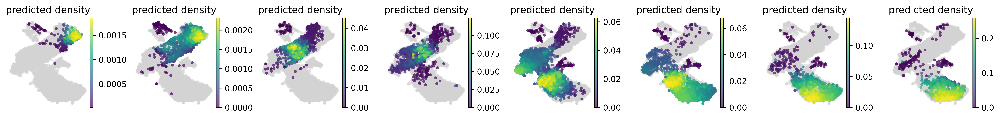

In [210]:
%matplotlib inline

fig, axs = PINN.pl.params_in_umap(train_DS.adata, u_sim_inv['3'], param=f'u obs bw{bw}', subplot_kws={'frameon':False, 'dpi':600});
for i,t in enumerate(train_DS.popD['t']):
    axs[i].set_title(f'predicted density')

In [205]:
fig.savefig("results/meahr/predicted_density.svg")

(<Figure size 1980x180 with 8 Axes>,
 array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >, <Axes: >], dtype=object))

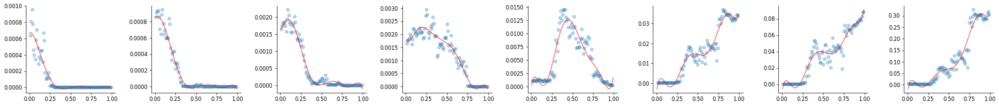

In [83]:
aggregate_params_by_pseudotime(u_b, 'u')

In [62]:
obs.time

obs_names
GGCATCGGTTAT.E17_5_WholeThy_rep2    17.5
TTTACTTTAGAG.E17_5_WholeThy_rep2    17.5
GTGCCGGGACAT.E17_5_WholeThy_rep2    17.5
ATTGTCTATATA.E17_5_WholeThy_rep2    17.5
ACTCAAAAATTC.E17_5_WholeThy_rep2    17.5
                                    ... 
AAAGTCTGAAAT.P0_WholeThy_rep1       19.5
TGGGTGATGTGT.P0_WholeThy_rep1       19.5
CGCCTATGGGCT.P0_WholeThy_rep1       19.5
GTCACAGCTGAN.P0_WholeThy_rep1       19.5
TCTGAACACCAC.P0_WholeThy_rep1       19.5
Name: time, Length: 10072, dtype: float64

In [63]:
from scipy.stats import gaussian_kde

In [65]:
import seaborn as sns

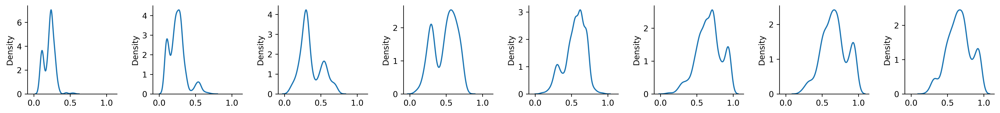

In [68]:
obs =  meahr_monocle.obs.copy()
n_timepoints = len(meahr_monocle.uns['pop']['t'])

fig, axs = plt.subplots(1, n_timepoints, figsize=(n_timepoints*2.7,2), gridspec_kw={'wspace':0.4}, sharex=True, dpi=600)

for i,t in enumerate(meahr_monocle.uns['pop']['t']):
    sns.kdeplot(obs[obs.time == t].pseudotime_scaled.values, ax=axs[i])
    sns.despine(ax=axs[i])


## load model

In [17]:
device = 'cuda:3'

In [18]:
log_dir = "logs/meahr_monocle-DM_EigenVectors_multiscaled_n8/pde_params_tsense/lightning_logs/"

ckpt_dict = {}
ckpt_dict["v0_ckpt"] = f"{log_dir}/version_0/checkpoints/epoch=240-total_loss=10.81558990.ckpt" 
ckpt_dict["v1_ckpt"] = f"{log_dir}/version_1/checkpoints/epoch=146-total_loss=8.45054054.ckpt"
ckpt_dict["v2_ckpt"] = f"{log_dir}/version_2/checkpoints/epoch=259-total_loss=22.66468239.ckpt"
ckpt_dict["v3_ckpt"] = f"{log_dir}/version_3/checkpoints/epoch=240-total_loss=48.43002319.ckpt"
ckpt_dict["v4_ckpt"] = f"{log_dir}/version_4/checkpoints/epoch=204-total_loss=74.89583588.ckpt"


def simulate_u(pde_model):
    timepoint_idx = None
    u_int_all = PINN.tl.density_shortterm_simulation(pde_model, train_DS, timepoints=train_DS.T_b/pde_model.time_scale_factor)
    u_int_all = np.concatenate([u_b[0].reshape(1,-1), u_int_all], axis=0)
    return u_int_all

u_sim = {}
params = {}

for v in [0,1,2,3,4]:
    # load
    model = PINN.models.pde_params.load_from_checkpoint(ckpt_dict[f'v{v}_ckpt'], map_location=device)
    
    param_ays = model.predict_param(train_DS)
    for i,p in enumerate(['v','g','D']):
        params[f'{p}_v{v}'] = param_ays[i]

    u_sim[str(v)] = simulate_u(model)
    del model

0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4


In [19]:
# short-term

In [98]:
def params_agg_boxplot(params, param_names='g v2', timepoints=None, adata=meahr_monocle, agg_key='pseudotime_scaled'):
    
    # PINN.pl.params_in_umap(adata, params, param=param_names, cell_of_t=False,subplot_kws={'frameon':False, 'dpi':60});
    # pl.params_in_umap(adata, params, param=param_names, timepoints=timepoints, copy=False, cell_of_t=False);
    
    if 'pseudotime' in agg_key:
        
        pdt_bins = np.linspace(0,1,11)
        pdt_label = (pdt_bins[1:] + pdt_bins[:-1])/2
        adata.obs['pseudotime_bin'] = pd.cut(adata.obs[agg_key], bins=10,
                                                    labels = pdt_label)
        agg_key = 'pseudotime_bin'                                                


    timepoints = adata.uns['pop']['t'] if timepoints is None else timepoints 
    fig, axs = plt.subplots(2, len(timepoints)//2, figsize=(4*len(timepoints)+1, 5), gridspec_kw={"wspace":0.4, 'hspace':0.3}, dpi=90)
    axs = axs.flatten() if len(timepoints)>1 else [axs]
    
    for i,t in enumerate(timepoints):
        y_col = 'Day%s_'%t + param_names
        data = adata.obs[[agg_key]]
        data[y_col] = params[i]
        
        sns.boxplot(data=data, x=agg_key, y=y_col, ax=axs[i])
        sns.lineplot(data=data, x=agg_key, y=y_col, ax=axs[i])
        
    return fig, axs

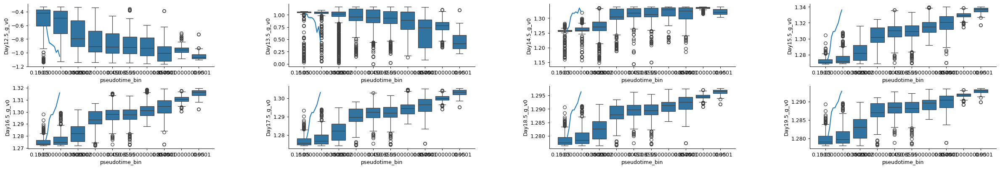

In [99]:
params_agg_boxplot(params[f'g_v{v}'], f'g_v{v}', agg_key='pseudotime_scaled');

(<Figure size 2970x450 with 8 Axes>,
 array([<Axes: xlabel='pseudotime_bin', ylabel='Day12.5_g_v0'>,
        <Axes: xlabel='pseudotime_bin', ylabel='Day13.5_g_v0'>,
        <Axes: xlabel='pseudotime_bin', ylabel='Day14.5_g_v0'>,
        <Axes: xlabel='pseudotime_bin', ylabel='Day15.5_g_v0'>,
        <Axes: xlabel='pseudotime_bin', ylabel='Day16.5_g_v0'>,
        <Axes: xlabel='pseudotime_bin', ylabel='Day17.5_g_v0'>,
        <Axes: xlabel='pseudotime_bin', ylabel='Day18.5_g_v0'>,
        <Axes: xlabel='pseudotime_bin', ylabel='Day19.5_g_v0'>],
       dtype=object))

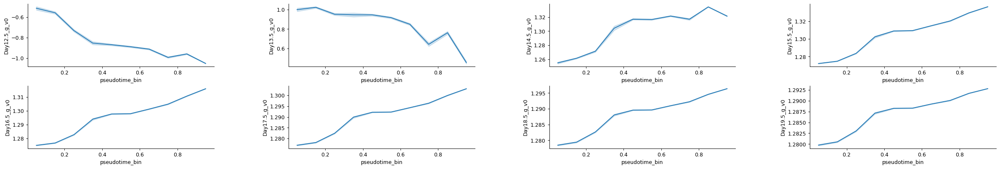

In [96]:
params_agg_boxplot(params[f'g_v{v}'], f'g_v{v}', agg_key='pseudotime_scaled')

(<Figure size 2970x450 with 8 Axes>,
 array([<Axes: xlabel='leiden', ylabel='Day12.5_g_v0'>,
        <Axes: xlabel='leiden', ylabel='Day13.5_g_v0'>,
        <Axes: xlabel='leiden', ylabel='Day14.5_g_v0'>,
        <Axes: xlabel='leiden', ylabel='Day15.5_g_v0'>,
        <Axes: xlabel='leiden', ylabel='Day16.5_g_v0'>,
        <Axes: xlabel='leiden', ylabel='Day17.5_g_v0'>,
        <Axes: xlabel='leiden', ylabel='Day18.5_g_v0'>,
        <Axes: xlabel='leiden', ylabel='Day19.5_g_v0'>], dtype=object))

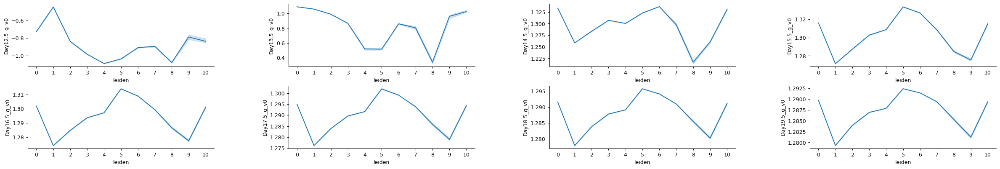

In [97]:
params_agg_boxplot(params[f'g_v{v}'], f'g_v{v}', agg_key='leiden')

prediction of shape (8, 10104)


prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)


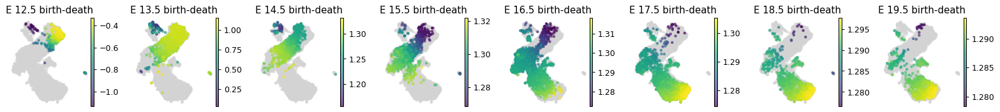

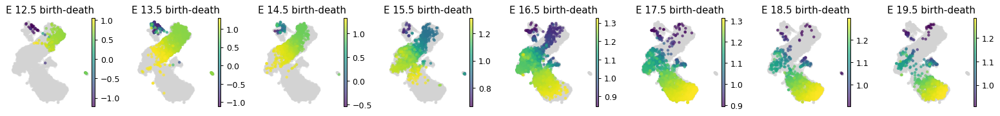

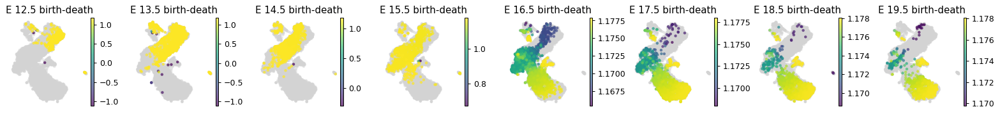

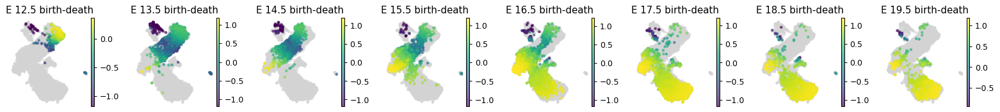

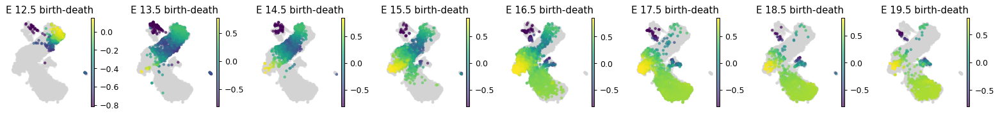

In [30]:
%matplotlib inline
for v in [0,1,2,3,4]:
    fig, axs = PINN.pl.params_in_umap(train_DS.adata, params[f'g_v{v}'], cell_of_t=True, param=f'g_v{v}', subplot_kws={'frameon':False, 'dpi':90});
    for i,t in enumerate(train_DS.popD['t']):
        axs[i].set_title(f'E {t} birth-death')

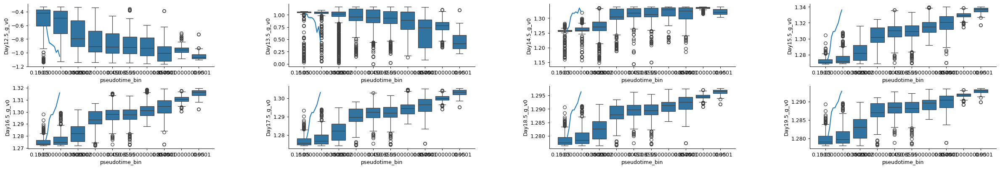

In [ ]:
params_agg_boxplot(params[f'g_v{v}'], f'g_v{v}', agg_key='pseudotime_scaled');

prediction of shape (8, 10104)


prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)


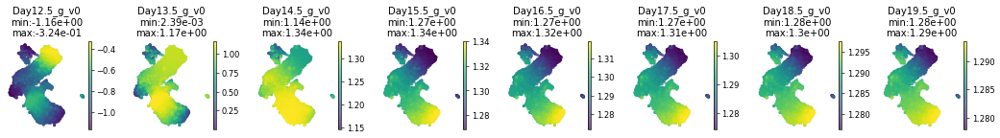

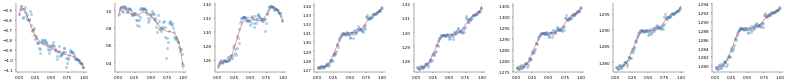

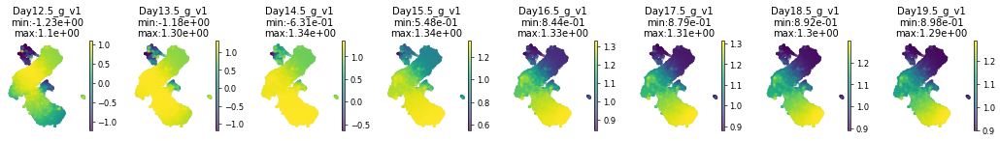

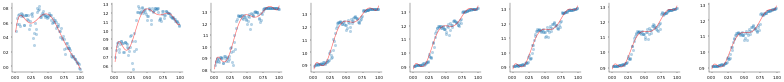

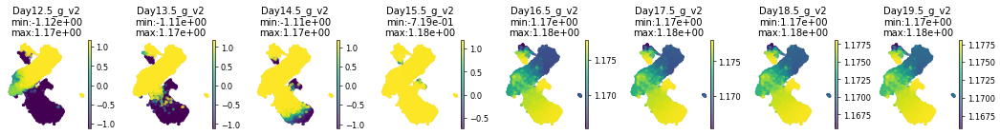

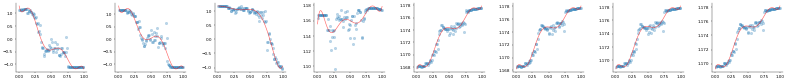

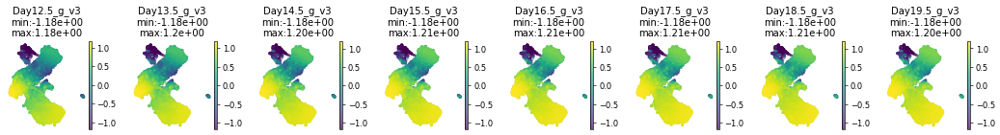

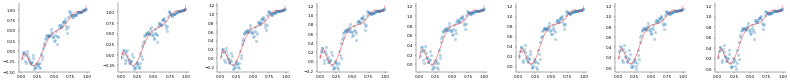

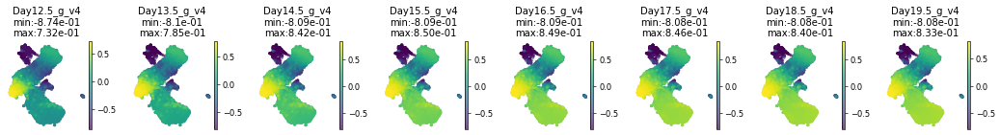

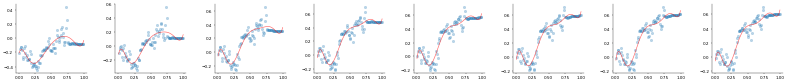

In [24]:
# change the dpi
with plt.rc_context({"figure.dpi":30}): 
    for v in [0,1,2,3,4]:
        aggregate_params_by_pseudotime(params[f'g_v{v}'], 
                param_names=f'g_v{v}', pseudotime_key='pseudotime_scaled')

# time invariant params

In [21]:
ckpt_dir = "logs/meahr_monocle-DM_EigenVectors_multiscaled_n8/pde_params/lightning_logs"
test_ckpt = f"{ckpt_dir}/test_version/checkpoints/epoch=84-total_loss=21.41970634.ckpt"

test_model = PINN.models.pde_params.load_from_checkpoint(test_ckpt)

In [208]:
def simulate_u(pde_model, train_DS):
    timepoint_idx = None
    u_int_all = PINN.tl.density_shortterm_simulation(pde_model, train_DS, timepoints=train_DS.T_b/pde_model.time_scale_factor)
    u_int_all = np.concatenate([train_DS.u_b[0].numpy().reshape(1,-1), u_int_all], axis=0)
    return u_int_all
    

ckpt_dir = "logs/meahr_monocle-DM_EigenVectors_multiscaled_n8/pde_params/lightning_logs"

inv_ckpt = {}
inv_ckpt['ckpt_v0'] = f"{ckpt_dir}/version_0/checkpoints/epoch=261-total_loss=40.05668259.ckpt"
inv_ckpt['ckpt_v1'] = f"{ckpt_dir}/version_1/checkpoints/epoch=263-total_loss=41.80414963.ckpt"
inv_ckpt['ckpt_v2'] = f"{ckpt_dir}/version_2/checkpoints/epoch=179-total_loss=25.30693054.ckpt"
inv_ckpt['ckpt_v3'] = f"{ckpt_dir}/version_3/checkpoints/epoch=257-total_loss=24.58522797.ckpt"
inv_ckpt['ckpt_v4'] = f"{ckpt_dir}/version_4/checkpoints/epoch=291-total_loss=22.56603622.ckpt"
inv_ckpt['ckpt_vtest'] = f"{ckpt_dir}/test_version/checkpoints/epoch=84-total_loss=21.41970634.ckpt"

model_inv = {}
u_sim_inv = {}
params_inv = {}
for v in [0,1,2,3,4,'test']:
    model_inv[f'{v}'] = PINN.models.pde_params.load_from_checkpoint(inv_ckpt[f'ckpt_v{v}'])
    
    param_ays = model_inv[f'{v}'].predict_param(train_DS)
    for i,p in enumerate(['v','g','D']):
        params_inv[f'{p}_v{v}'] = param_ays[i]

    u_sim = simulate_u( model_inv[f'{v}'], train_DS);
    print(v, u_sim.sum(axis=1))

    u_sim_inv[str(v)] = u_sim

0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4
0 [  1.          1.7300255   6.932676   17.458347   91.33124   173.16318
 342.5237    641.408    ]


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4


simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4
1 [  1.          1.9590588   5.220871   16.501627  121.80037   235.24144
 266.2284    681.11237  ]


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4
2 [  1.          3.5213723   5.5904226  16.234985   65.3348    141.83237
 290.90842   801.98773  ]


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4
3 [  1.         3.363373  35.00785  109.01741  167.37483  231.93655
 388.12366  673.79596 ]


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4
4 [1.0000000e+00 1.9722680e+00 7.9318843e+00 3.9326801e+01 1.3059142e+02
 2.1413795e+02 5.5891571e+02 1.0630061e+03]


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
simulating from timepoint 0.8 to 1.0
simulating from timepoint 1.0 to 1.2
simulating from timepoint 1.2 to 1.4
test [  1.          5.9771996  12.04509    16.059391   25.348202   70.16808
 146.28522   332.51154  ]


save the checkpoints and result

<font size=1.5>

```python
    np.save('results/meahr/time_inv_ckpt_path.npy',inv_ckpt)
    np.save('results/meahr/time_inv_params.npy',params_inv)
    np.save('results/meahr/time_inv_u_simulate.npy',u_sim_inv)
    np.save('results/meahr/time_inv_meahr_cb.npy',meahr_monocle.obs_names)
```

</font>

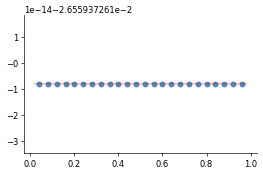

In [212]:
y =  aggregate_params_by_pseudotime(meahr_monocle.obs.G2M_score.values, param_names=f'g_v3',
                                   timepoints=train_DS.popD['t'][[0]],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_DS.adata, nbins=25, return_y=True)
        

In [ ]:
from PINN.models import CubicSpline
import torch

In [ ]:
x = tor

In [ ]:
g_cs = CubicSpline

In [ ]:
sns.lineplot()

<Axes: xlabel='pseudotime_bin', ylabel='g_v3_inv'>

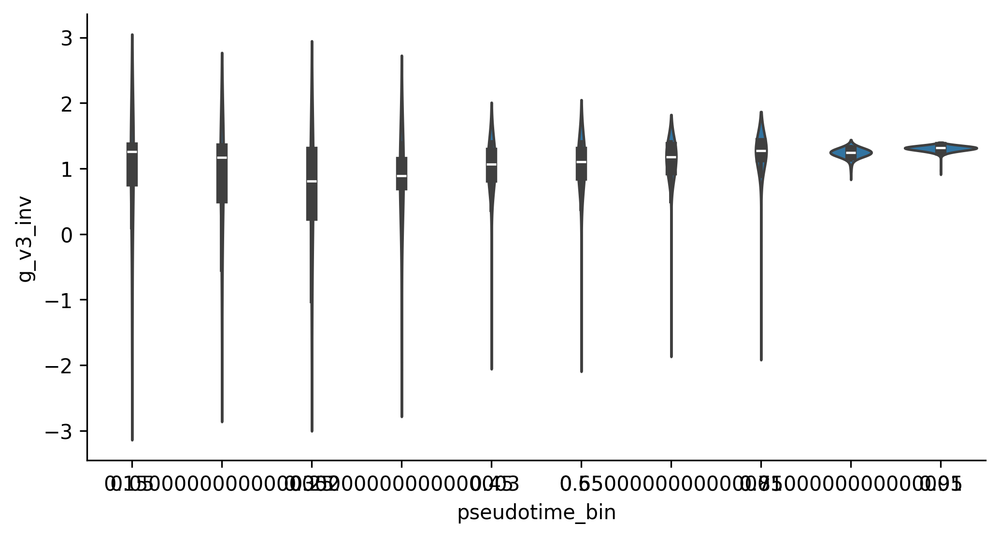

In [163]:
fig = plt.figure(figsize=(8,4), dpi=300)


sns.violinplot(data=meahr_monocle.obs, x='pseudotime_bin', y='g_v3_inv', ax=fig.gca(), bw_method=1)


prediction of shape (8, 10104)


prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)
prediction of shape (8, 10104)


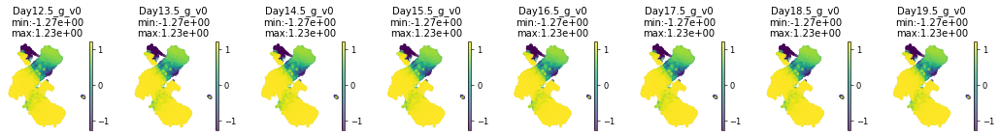

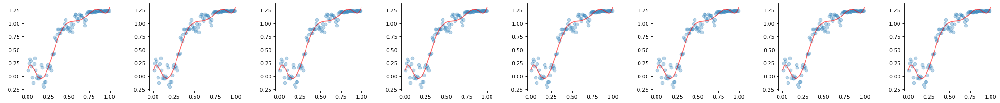

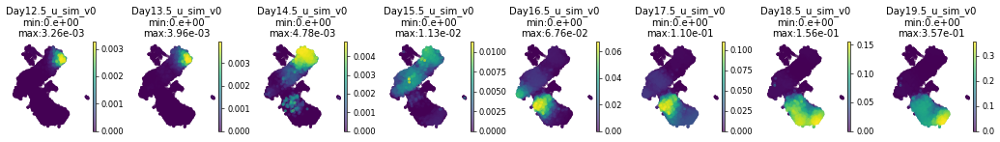

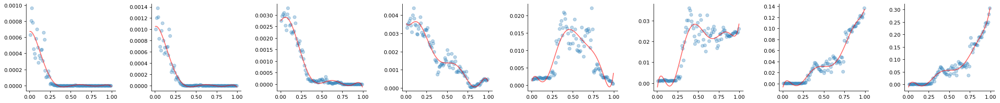

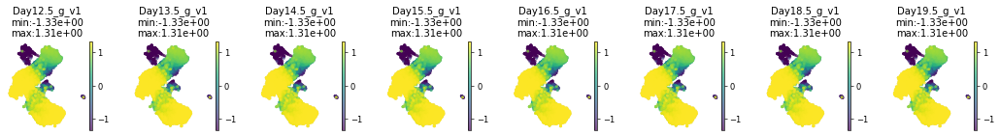

...

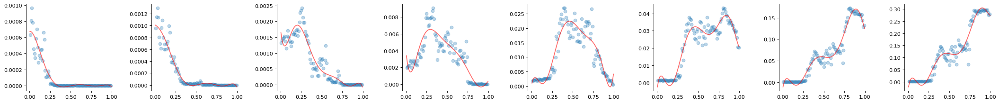

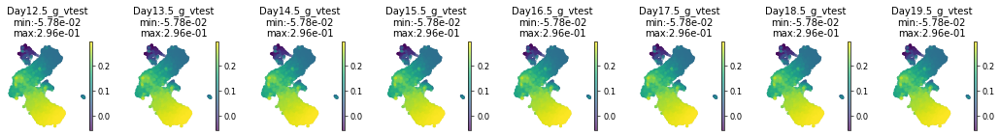

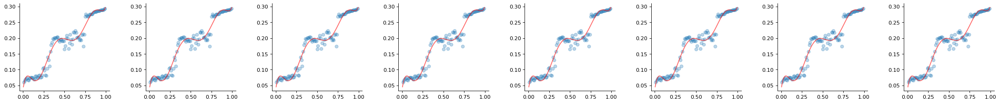

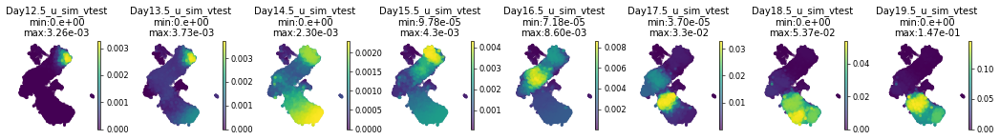

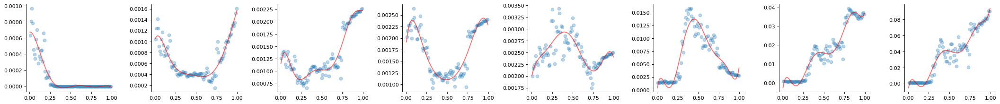

In [26]:
with plt.rc_context({"figure.dpi":80}): 
    for v in [0,1,2,3,4,'test']:
        aggregate_params_by_pseudotime(params_inv[f'g_v{v}'], param_names=f'g_v{v}',
                                   timepoints=train_DS.popD['t'],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_DS.adata)
        
        aggregate_params_by_pseudotime(u_sim_inv[str(v)], param_names=f'u_sim_v{v}',
                                   timepoints=train_DS.popD['t'],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_DS.adata)

# timepoints [1,2,3,4]

In [108]:
timepoint_idx = [1,2,3,4]

bw = 0.5
n_timepoint = len(timepoint_idx)
n_dimension = 7

train_t4_DS = reader.TwoTimpepoint_AnnDS(
                    AnnData=meahr_monocle, 
                    timepoint_idx = timepoint_idx, 
                    n_dimension = n_dimension,
                    cellstate_key='DM_EigenVectors_multiscaled',  #'DM_EigenVector'
                    log_transform=False,
                    norm_time='min_minus',
                    deltax_key='Delta_DM',
                    kde_kws = {"bw_method":bw},
                    batchsize=200)

u_t4 = train_t4_DS.u_b.numpy()

Computing density :
`density_funs` not specified, use gaussian kde


In [ ]:
device = 'cuda:3'

In [101]:
ckpt_dir = "logs/meahr_monocle-DM_EigenVectors_multiscaled_n[1, 2, 3, 4]/pde_params/lightning_logs/"

t4_ckpt = {}
t4_ckpt['ckpt_v0'] = f"{ckpt_dir}/version_0/checkpoints/epoch=80-total_loss=8.68898964.ckpt"
t4_ckpt['ckpt_v1'] = f"{ckpt_dir}/version_1/checkpoints/epoch=52-total_loss=35.91765976.ckpt"
t4_ckpt['ckpt_v2'] = f"{ckpt_dir}/version_2/checkpoints/epoch=37-total_loss=48.05711746.ckpt"
t4_ckpt['ckpt_v3'] = f"{ckpt_dir}/version_3/checkpoints/epoch=57-total_loss=69.78382874.ckpt"

for v in [0,1,2,3]:
    globals()[f'model_t4_v{v}'] = PINN.models.pde_params.load_from_checkpoint(t4_ckpt[f'ckpt_v{v}'])
    

In [110]:
params = {}
for v in [0,1,2,3]:
    param_ays = globals()[f'model_t4_v{v}'].predict_param(train_t4_DS)
    for i,p in enumerate(['v','g','D']):
        params[f'{p}_v{v}'] = param_ays[i]

    with plt.rc_context({"figure.dpi":10}): 
        aggregate_params_by_pseudotime(param_ays[1][[0]], param_names=f'g_v{v}',
                                    timepoints=train_t4_DS.popD['t'][[0]],
                                        pseudotime_key='pseudotime_scaled', 
                                        adata=train_t4_DS.adata)

prediction of shape (1, 6315)
prediction of shape (1, 6315)
prediction of shape (1, 6315)


prediction of shape (1, 6315)


# timepoints [1,2,3,4,5]

In [78]:
timepoint_idx = [1,2,3,4,5]

bw = 0.2
n_timepoint = len(timepoint_idx)
n_dimension = 7

train_t5_DS = reader.TwoTimpepoint_AnnDS(
                    AnnData=meahr_monocle, 
                    timepoint_idx = timepoint_idx, 
                    n_dimension = n_dimension,
                    cellstate_key='DM_EigenVectors_multiscaled',  #'DM_EigenVector'
                    log_transform=False,
                    norm_time='min_minus',
                    deltax_key='Delta_DM',
                    kde_kws = {"bw_method":bw},
                    batchsize=200)

u_t5 = train_t5_DS.u_b.numpy()

Computing density :
`density_funs` not specified, use gaussian kde


prediction of shape (5, 8282)


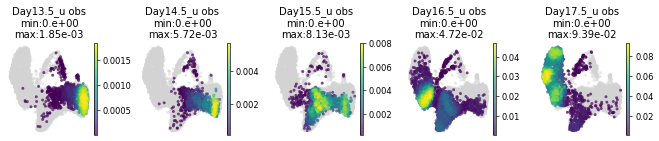

In [79]:
PINN.pl.params_in_umap(train_t5_DS.adata, u_t5,  train_t5_DS.popD['t'], 'u obs');

In [80]:
device = 'cuda:3'

In [82]:
def simulate_u(pde_model, train_DS):
    timepoint_idx = None
    u_int_all = PINN.tl.density_shortterm_simulation(pde_model, train_DS, timepoints=train_DS.T_b/pde_model.time_scale_factor)
    u_int_all = np.concatenate([train_DS.u_b[0].numpy().reshape(1,-1), u_int_all], axis=0)
    return u_int_all
    

ckpt_dir = "logs/meahr_monocle-DM_EigenVectors_multiscaled_n[1, 2, 3, 4, 5]/pde_params/lightning_logs"

t5_ckpt = {}
t5_ckpt['ckpt_v0'] = f"{ckpt_dir}/version_0/checkpoints/epoch=36-total_loss=15.24166965.ckpt"
t5_ckpt['ckpt_v1'] = f"{ckpt_dir}/version_1/checkpoints/epoch=23-total_loss=8.90282345.ckpt"
t5_ckpt['ckpt_v2'] = f"{ckpt_dir}/version_2/checkpoints/epoch=53-total_loss=70.84193420.ckpt"
t5_ckpt['ckpt_v3'] = f"{ckpt_dir}/version_3/checkpoints/epoch=59-total_loss=73.38562775.ckpt"

model_t5 = {}
u_sim_t5 = {}
params_t5 = {}
for v in [0,1,2,3]:
    model_t5[f'{v}'] = PINN.models.pde_params.load_from_checkpoint(t5_ckpt[f'ckpt_v{v}'])
    
    param_ays = model_t5[f'{v}'].predict_param(train_t5_DS)
    for i,p in enumerate(['v','g','D']):
        params_t5[f'{p}_v{v}'] = param_ays[i]

    u_sim = simulate_u( model_t5[f'{v}'], train_t5_DS)
    print(v, u_sim.sum(axis=1))

    u_sim_t5[str(v)] = u_sim

with plt.rc_context({"figure.dpi":70}): 
    for v in [0,1,2,3]:
        aggregate_params_by_pseudotime(u_sim_t5[str(v)], param_names=f'u_sim_v{v}',
                                   timepoints=train_t5_DS.popD['t'],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_t5_DS.adata)

with plt.rc_context({"figure.dpi":30}): 
    for v in [0,1,2,3]:
        aggregate_params_by_pseudotime(params_t5[f'g_v{v}'][[0]], param_names=f'g_v{v}',
                                   timepoints=train_t5_DS.popD['t'][[0]],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_t5_DS.adata)

0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2


simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
0 [ 1.6886228  4.009267  11.855184  25.708603  71.11048  ]


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
1 [  1.6886228   5.2339516  12.545848   41.734512  153.69376  ]


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
2 [ 1.6886228 16.39924   13.16584   21.79041   61.394814 ]


0it [00:00, ?it/s]

simulating from timepoint 0.0 to 0.2
simulating from timepoint 0.2 to 0.4
simulating from timepoint 0.4 to 0.6
simulating from timepoint 0.6 to 0.8
3 [  1.6886228  27.10742    18.683846   67.37338   129.05626  ]


prediction of shape (5, 8282)


/ssd/users/Wergillius/Project/PINN_dynamics/PINN/plotting_fns/param_plot.py:60: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[f'Day{t}_{param}'] = prediction[i]


prediction of shape (5, 8282)
prediction of shape (5, 8282)
prediction of shape (5, 8282)


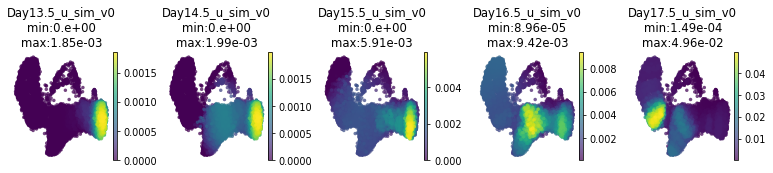

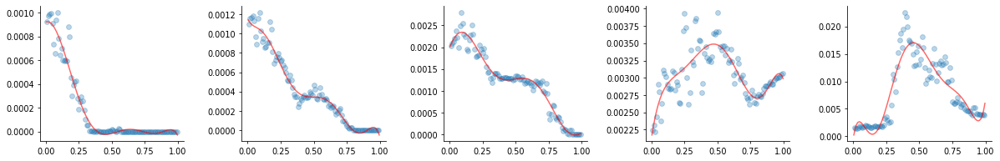

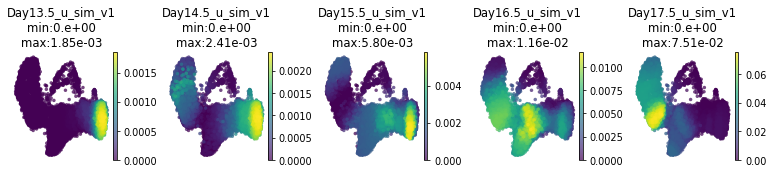

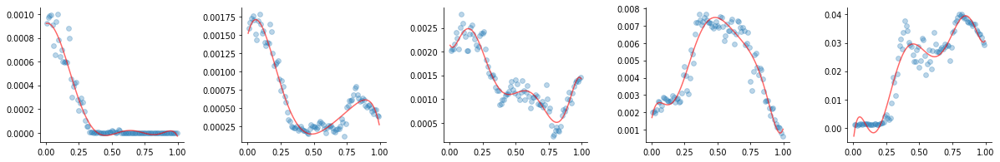

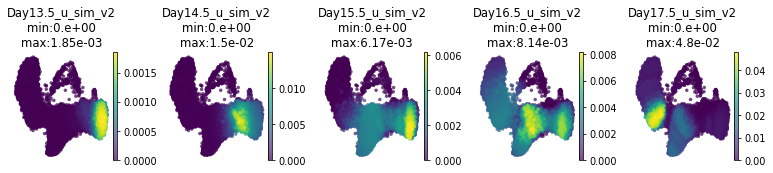

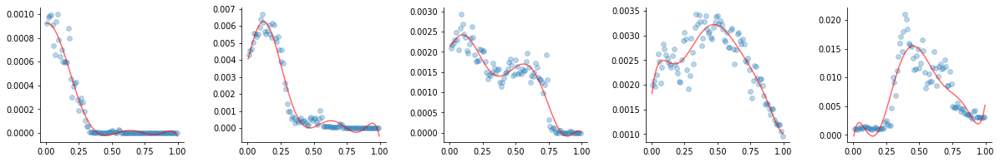

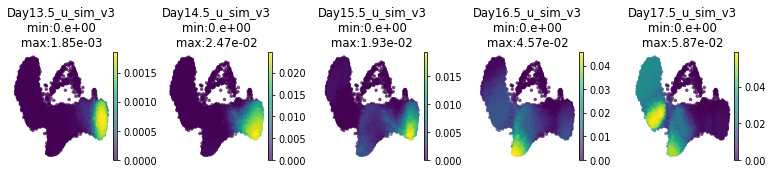

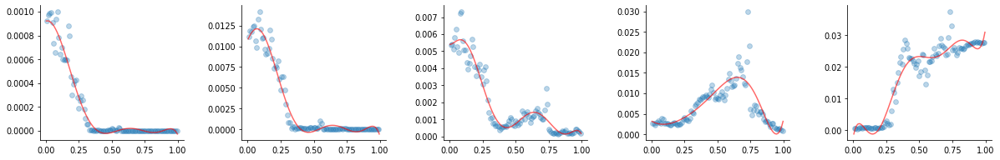

In [84]:
with plt.rc_context({"figure.dpi":70}): 
    for v in [0,1,2,3]:
        aggregate_params_by_pseudotime(u_sim_t5[str(v)], param_names=f'u_sim_v{v}',
                                   timepoints=train_t5_DS.popD['t'],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_t5_DS.adata)

prediction of shape (1, 8282)
prediction of shape (1, 8282)
prediction of shape (1, 8282)
prediction of shape (1, 8282)


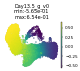

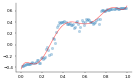

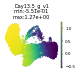

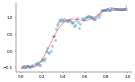

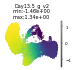

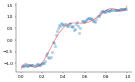

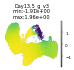

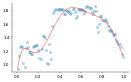

In [98]:
with plt.rc_context({"figure.dpi":30}): 
    for v in [0,1,2,3]:
        aggregate_params_by_pseudotime(params_t5[f'g_v{v}'][[0]], param_names=f'g_v{v}',
                                   timepoints=train_t5_DS.popD['t'][[0]],
                                    pseudotime_key='pseudotime_scaled', 
                                    adata=train_t5_DS.adata)

# cell cycle

In [191]:
meahr_monocle

AnnData object with n_obs × n_vars = 10104 × 7006
    obs: 'barcodes', 'pseudodynamics_branch_class', 'palantir_pseudotime', 'branching_region', 'branch_class', 'time', 'batch', 'pseudotime', 'cell', 'batch_to_match', 'pseudotime_scaled', 'timepoint_tx_days', 'leiden', 'pseudotime_bin', 'g_v3_inv', 'celltype', 'S_score', 'G2M_score', 'phase'
    var: 'TC_MAGIC_pdt_r', 'NK_MAGIC_pdt_r'
    uns: 'DM_EigenValues', 'Time_x_colors', 'Time_y_colors', 'diffmap_evals', 'dpt_changepoints', 'dpt_grouptips', 'iroot', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'palantir_waypoints', 'pca', 'pop', 'pseudodynamics_branch_class_colors', 'umap', 'celltype_colors'
    obsm: 'Cbl_Lpxn_scaled', 'Cbl_Rps6ka3_scaled', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'Delta_DM', 'X_Cbl_Adam19', 'X_Cbl_Lpxn', 'X_Cbl_Mllt3', 'X_Cbl_Rps6ka3', 'X_dc', 'X_diffmap', 'X_pca', 'X_phate', 'X_tsne', 'X_umap', 'branch_masks', 'diff component', 'fated_pdt', 'palantir_fate_probabilities', '

In [27]:
pdt_bins = np.linspace(0,1,11)
pdt_label = (pdt_bins[1:] + pdt_bins[:1])/2
meahr_monocle.obs['pseudotime_bin'] = pd.cut(meahr_monocle.obs['pseudotime'], bins=10,
                                             labels = pdt_label)

In [28]:
def cellcycle_stackbar(adata, time_col='pseudotime_bin'):
    
    df = adata.obs.groupby([time_col,'phase']).agg({'batch_y':'count'}).reset_index()
    
    n_bar = df[time_col].nunique()
    x = df[time_col].unique()

    dfs = []
    for t in x:
        df_t = df.query(f"`{time_col}` == @t")
        total = df_t.batch_y.values.sum()
        df_t.loc[:,'proportion'] = df_t['batch_y'] / total ;

        dfs.append(df_t)

    normed_df = pd.concat(dfs)


    base = np.zeros((n_bar,))

    for phase in normed_df.phase.unique():
        
        pro_t = normed_df.query('`phase` == @phase')
        height = pro_t.sort_values(time_col)['proportion'].values

        plt.bar(x=range(n_bar), height=height, label=phase, bottom=base, width=0.7)

        base += height

        plt.xticks(ticks=range(n_bar),labels=np.around(x,3))

    plt.legend(bbox_to_anchor=(1,0.4,0.3,0.1))

In [29]:
cellcycle_stackbar(meahr_monocle, 'pseudotime_bin');

KeyError: "Column(s) ['batch_y'] do not exist"

/tmp/ipykernel_3581870/3634918386.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_t.loc[:,'proportion'] = df_t['batch_y'] / total ;
/tmp/ipykernel_3581870/3634918386.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_t.loc[:,'proportion'] = df_t['batch_y'] / total ;
/tmp/ipykernel_3581870/3634918386.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

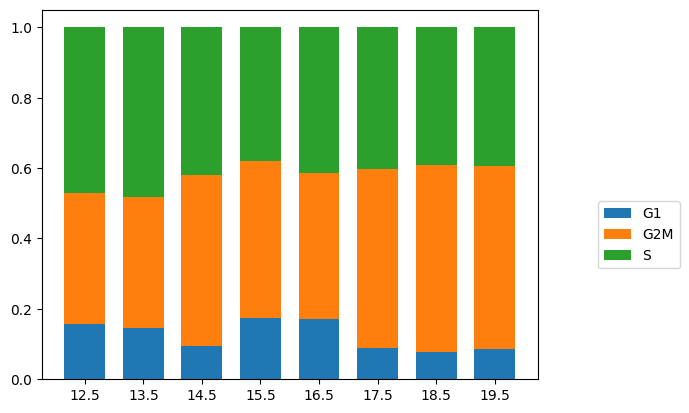

In [94]:
cellcycle_stackbar(meahr_monocle, 'time');